In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import muon as mu
from muon import prot as pt
import scirpy as ir
import scvelo as scv
import cellrank as cr
import scvi

/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
#settings
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(color_map='viridis')
sc.settings.set_figure_params(dpi=80, facecolor='white')
#scv.settings.presenter_view = True  # set max width size for presenter view
#scv.set_figure_params('scvelo')  # for beautified visualization

scanpy==1.9.8 anndata==0.10.6 umap==0.5.5 numpy==1.26.4 scipy==1.11.4 pandas==2.2.1 scikit-learn==1.4.1.post1 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.11


In [3]:
import os
data_dir="/Users/rvi33352/Documents/Datasets/10x_5kPBMC_sample"
for file in os.listdir(data_dir):
    print(file)

5k_pbmc_protein_v3_filtered_feature_bc_matrix.tar
filtered_feature_bc_matrix
.DS_Store
raw_feature_bc_matrix
5k_pbmc_protein_v3_raw_feature_bc_matrix.tar


In [4]:
mdata = mu.read_10x_mtx(os.path.join(data_dir, "filtered_feature_bc_matrix"))
mdata_raw = mu.read_10x_mtx(os.path.join(data_dir, "raw_feature_bc_matrix"))

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [5]:
prot = mdata.mod['prot']
prot

AnnData object with n_obs × n_vars = 5247 × 32
    var: 'gene_ids', 'feature_types'

In [6]:
mdata_raw['rna'].obs["log10umi"] = np.array(np.log10(mdata_raw['rna'].X.sum(axis=1) + 1)).reshape(-1)

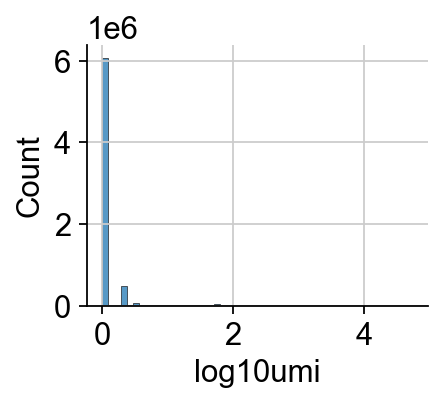

In [7]:
mu.pl.histogram(mdata_raw['rna'], ['log10umi'], bins=50)

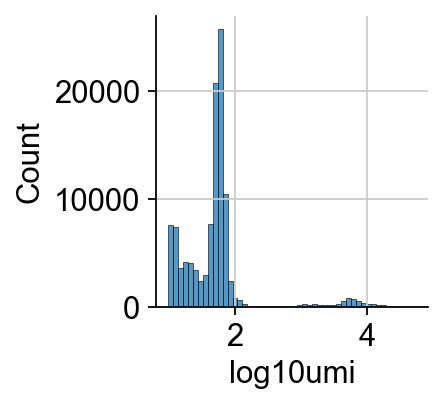

In [8]:
mu.pl.histogram(mdata_raw['rna'][mdata_raw['rna'].obs.log10umi >= 1], ['log10umi'], bins=50)

In [9]:
isotypes = mdata_raw['prot'].var_names[29:32].values
isotypes

array(['IgG1_control_TotalSeqB', 'IgG2a_control_TotalSeqB',
       'IgG2b_control_TotalSeqB'], dtype=object)

In [10]:
prot.layers['counts'] = prot.X

In [11]:
pt.pp.dsb(mdata, mdata_raw, empty_counts_range=(1.5, 2.8), isotype_controls=isotypes, random_state=1)

/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/muon/_prot/preproc.py:137: UserWarning: Dropping 49 empty droplets as they are already defined as cells
  warn(


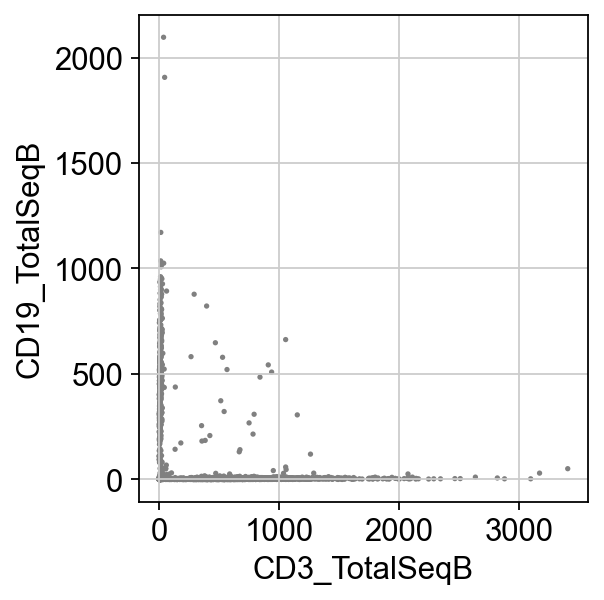

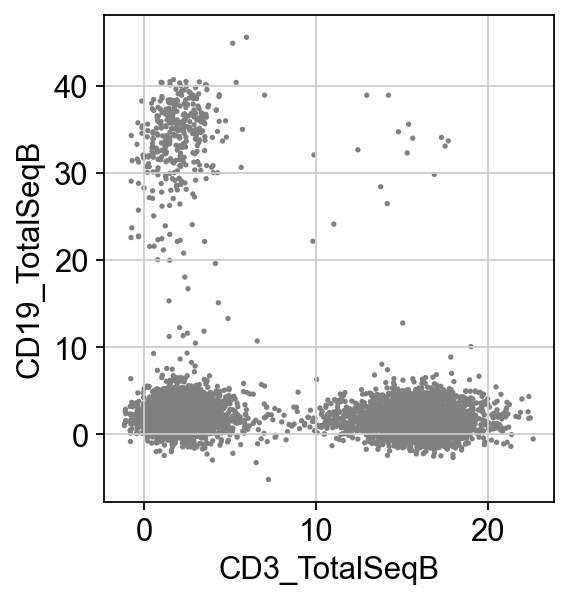

In [12]:
sc.pl.scatter(mdata['prot'], x="CD3_TotalSeqB", y="CD19_TotalSeqB", layers='counts')
sc.pl.scatter(mdata['prot'], x="CD3_TotalSeqB", y="CD19_TotalSeqB")

In [13]:
sc.tl.pca(prot)

computing PCA
    with n_comps=31
    finished (0:00:00)


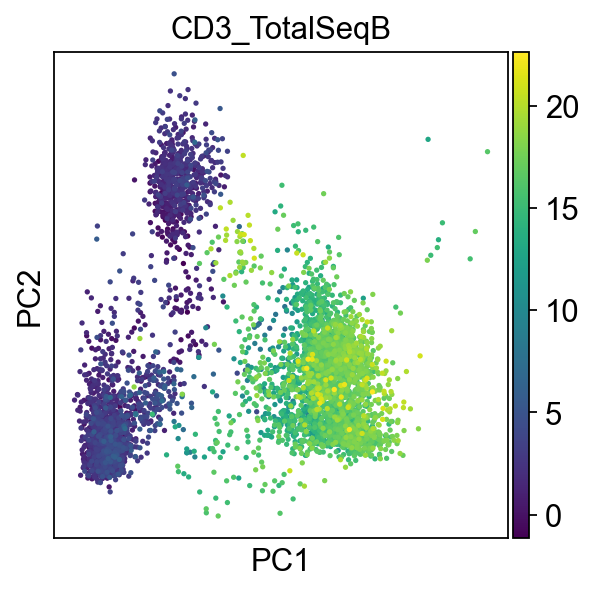

In [14]:
sc.pl.pca(prot, color='CD3_TotalSeqB')

In [15]:
sc.pp.neighbors(prot)
sc.tl.umap(prot, random_state=1)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


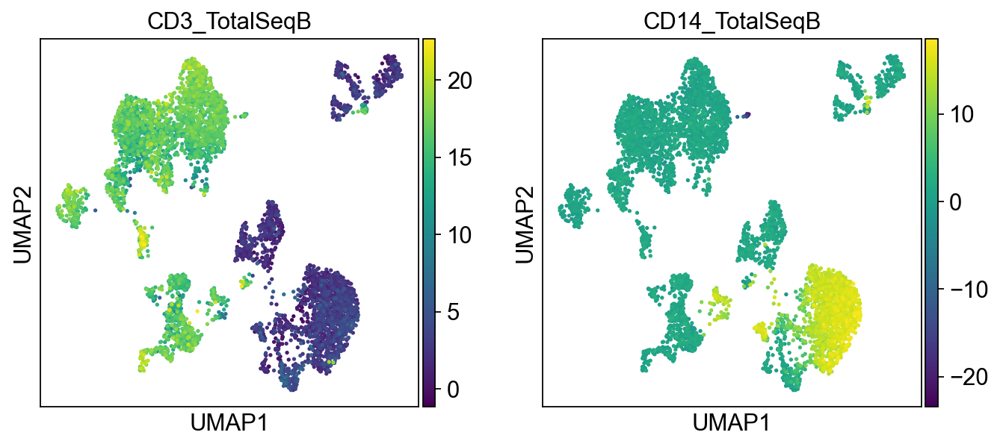

In [16]:
sc.pl.umap(prot, color=['CD3_TotalSeqB', 'CD14_TotalSeqB'])

In [17]:
rna = mdata.mod['rna']
rna

AnnData object with n_obs × n_vars = 5247 × 33538
    var: 'gene_ids', 'feature_types'

In [18]:
rna.var["mt"] = rna.var_names.str.startswith("MT-")
rna.var["ribo"] = rna.var_names.str.startswith(("RPS", "RPL"))
rna.var["hb"] = rna.var_names.str.contains("^HB[^(P)]")

In [19]:
sc.pp.calculate_qc_metrics(
    rna, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

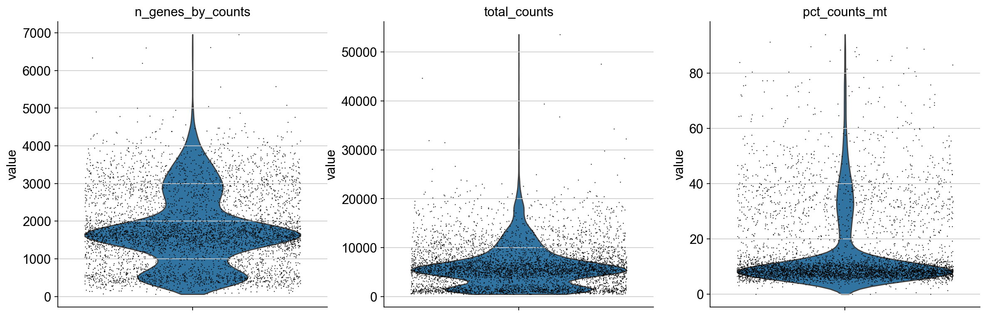

In [20]:
sc.pl.violin(
    rna,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

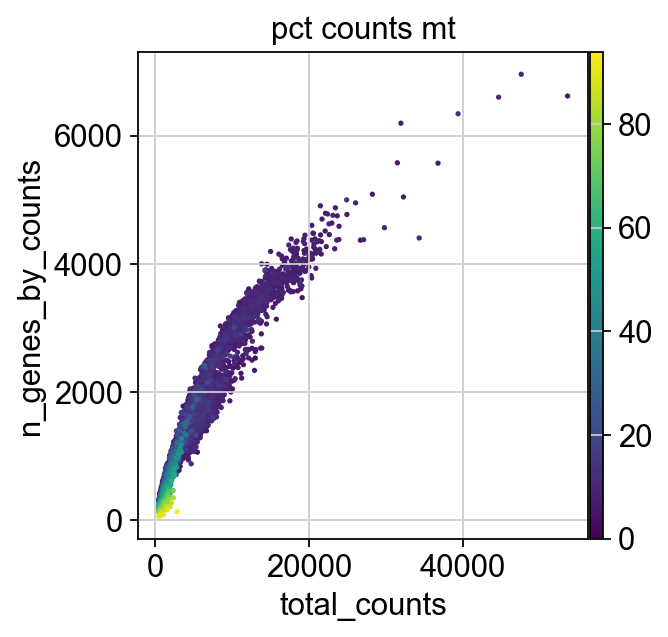

In [21]:
sc.pl.scatter(rna, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [22]:
mu.pp.filter_obs(rna, 'n_genes_by_counts', lambda x: (x >= 200) & (x < 5000))
# Same as the following but doesn't copy the object
#   sc.pp.filter_cells(rna, min_genes=200)
#   rna = rna[rna.obs.n_genes_by_counts < 5000, :]
mu.pp.filter_var(rna, 'n_cells_by_counts', lambda x: x >= 3)
# Same as the following but doesn't copy the object:
#   sc.pp.filter_genes(rna, min_cells=3)

In [23]:
mu.pp.filter_obs(rna, 'total_counts', lambda x: (x > 1500) & (x < 15000))
mu.pp.filter_obs(rna, 'pct_counts_mt', lambda x: x < 20)

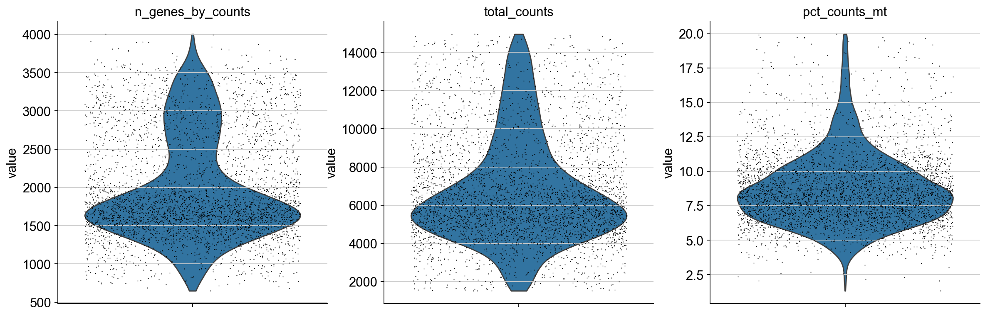

In [24]:
sc.pl.violin(rna, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [25]:
# Normalizing to median total counts
sc.pp.normalize_total(rna)
# Logarithmize the data
sc.pp.log1p(rna)

normalizing counts per cell
    finished (0:00:00)


In [26]:
sc.pp.highly_variable_genes(rna, n_top_genes=2000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


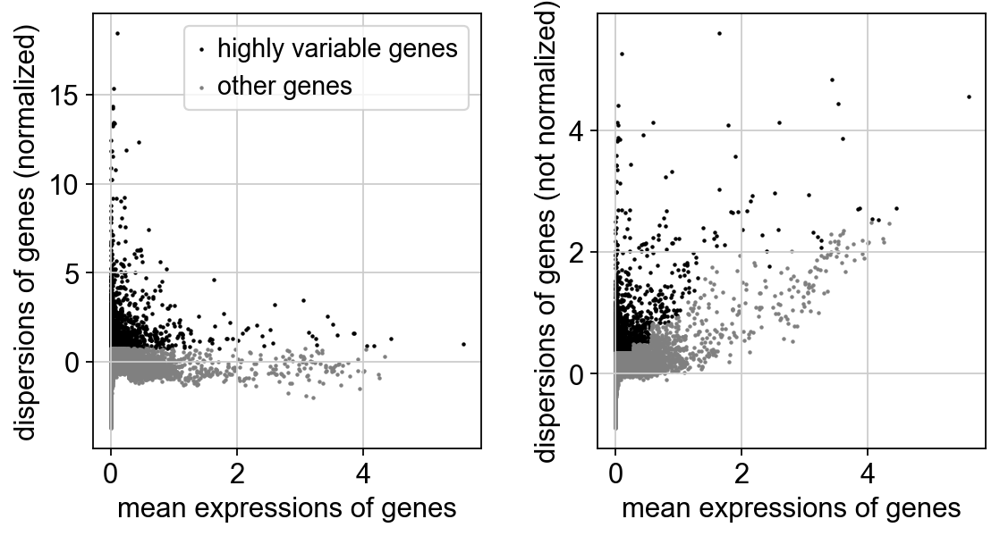

In [27]:
sc.pl.highly_variable_genes(rna)

In [28]:
sc.tl.pca(rna)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


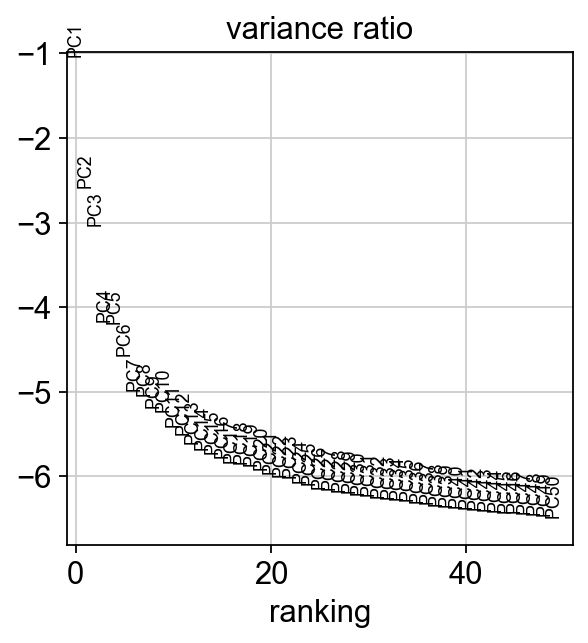

In [29]:
sc.pl.pca_variance_ratio(rna, n_pcs=50, log=True)

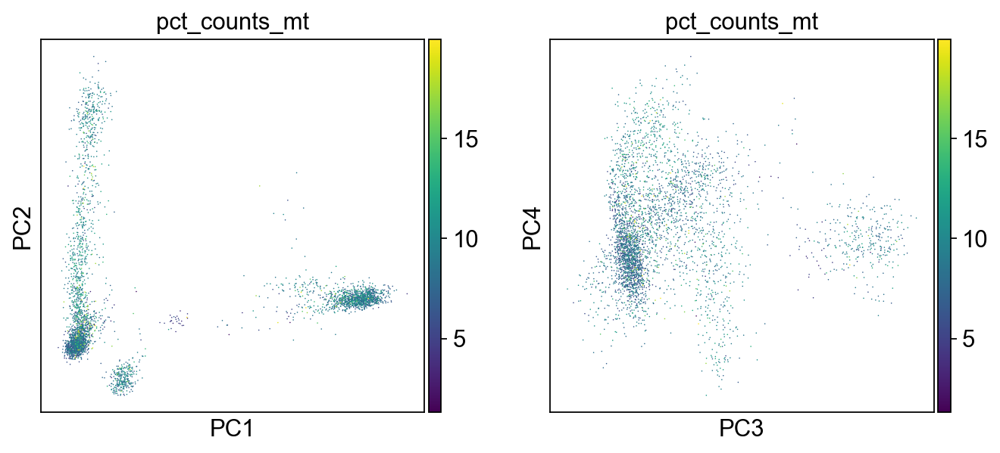

In [30]:
sc.pl.pca(
    rna,
    color=["pct_counts_mt", "pct_counts_mt"],
    dimensions=[(0, 1), (2, 3)],
    ncols=2,
    size=2,
)

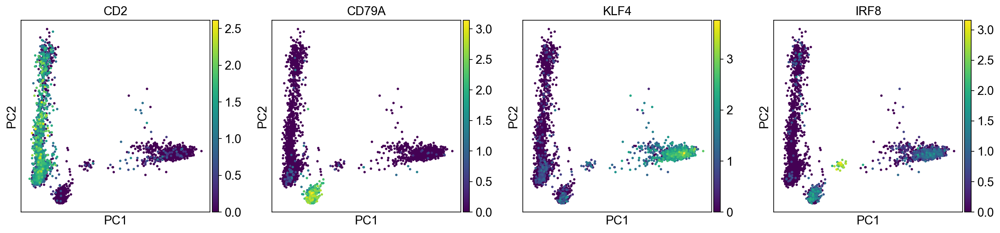

In [31]:
sc.pl.pca(rna, color=['CD2', 'CD79A', 'KLF4', 'IRF8'])

In [32]:
sc.pp.neighbors(rna)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


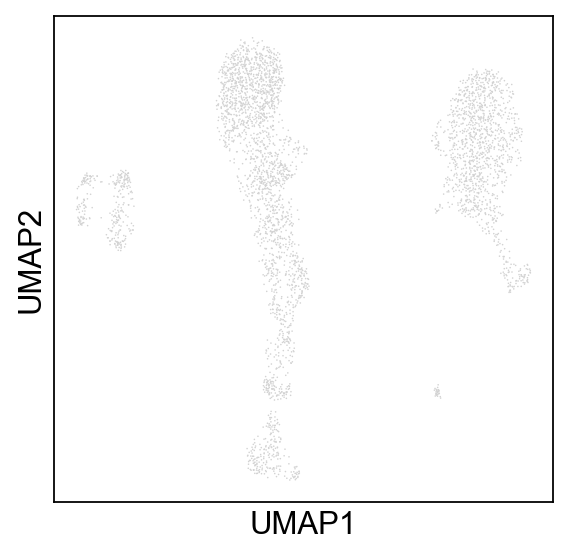

In [33]:
sc.tl.umap(rna)
sc.pl.umap(
    rna,
    # Setting a smaller point size to get prevent overlap
    size=2,
)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


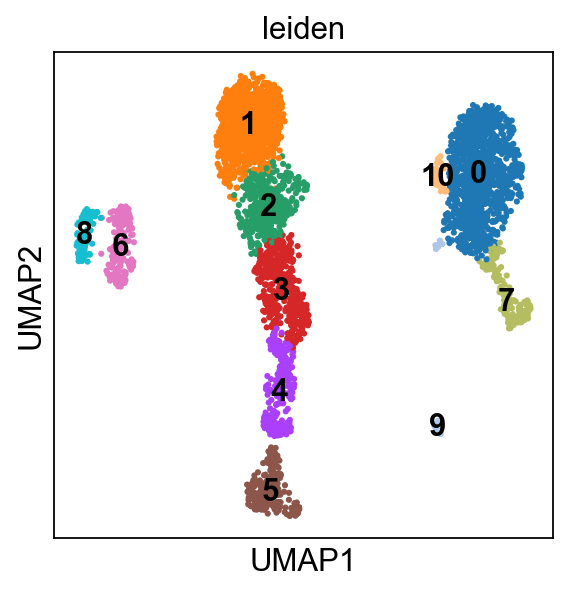

In [34]:
sc.tl.leiden(rna, resolution=.75)
sc.pl.umap(rna, color="leiden", legend_loc="on data")

In [35]:
for res in [0.02, 0.5, 2.0]:
    sc.tl.leiden(
        rna, key_added=f"leiden_res_{res:4.2f}", resolution=res
    )

running Leiden clustering
    finished: found 4 clusters and added
    'leiden_res_0.02', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 24 clusters and added
    'leiden_res_2.00', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


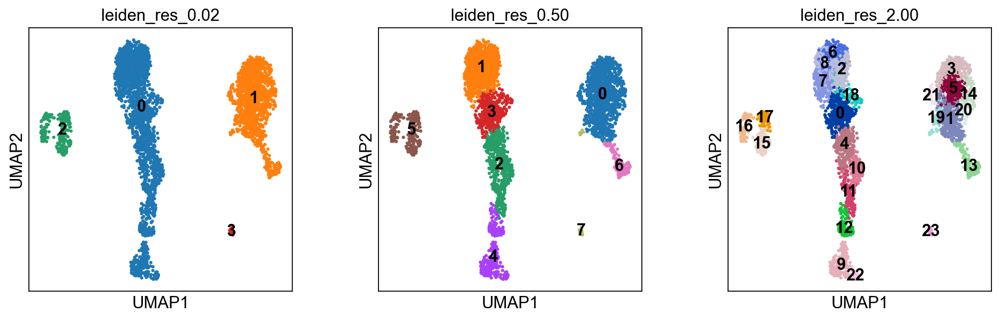

In [36]:
sc.pl.umap(
    rna,
    color=["leiden_res_0.02", "leiden_res_0.50", "leiden_res_2.00"],
    legend_loc="on data",
)

In [37]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    # Note: DMXL2 should be negative
    "cDC2": ["CST3", "COTL1", "LYZ", "DMXL2", "CLEC10A", "FCER1A"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    # Note HBM and GYPA are negative markers
    "Proerythroblast": ["CDK6", "SYNGR1"],
    "NK": ["GNLY", "NKG7", "CD247", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    # Note IGHD and IGHM are negative markers
    "B cells": [
        "MS4A1",
        "ITGB1",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
    ],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    # Note PAX5 is a negative marker
    "Plasmablast": ["XBP1", "PRDM1", "PAX5"],
    "CD4+ T": ["CD4", "IL7R", "TRBC2"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
}

/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


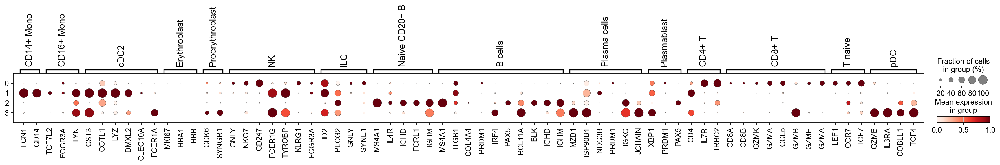

/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


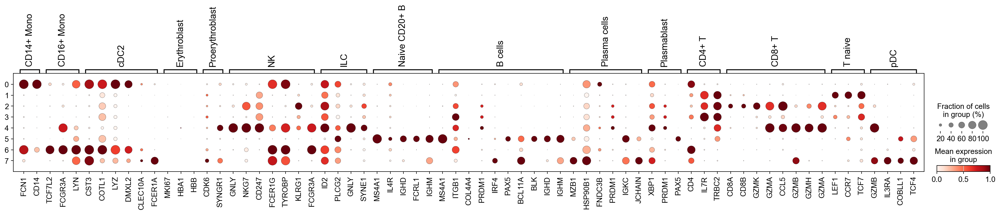

In [38]:
sc.pl.dotplot(rna, marker_genes, groupby="leiden_res_0.02", standard_scale="var")
sc.pl.dotplot(rna, marker_genes, groupby="leiden_res_0.50", standard_scale="var")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 2, etc.
var_group_labels: CD14+ Mono, CD16+ Mono, cDC2, etc.


/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


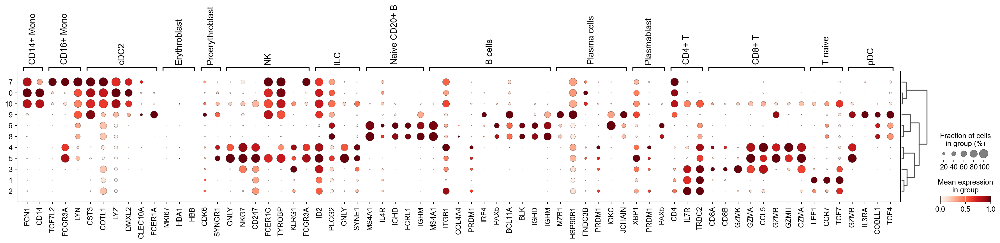

In [39]:
sc.pl.dotplot(rna, marker_genes, groupby="leiden", standard_scale="var", dendrogram=True)

In [40]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(rna, groupby="leiden", method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


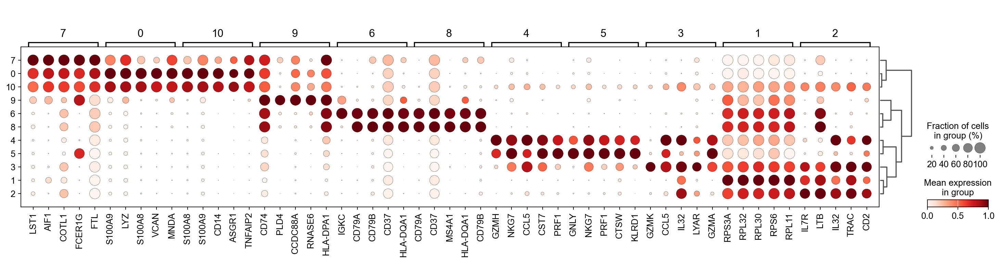

In [41]:
sc.pl.rank_genes_groups_dotplot(
    rna, groupby="leiden", standard_scale="var", n_genes=5
)

In [42]:
sc.get.rank_genes_groups_df(rna, group="8").head(5)

,names,scores,logfoldchanges,pvals,pvals_adj
0,CD79A,15.652637,5.729741,3.187329e-55,5.675358e-51
1,CD37,15.592488,2.453872,8.188086e-55,7.289853e-51
2,MS4A1,15.507051,5.640571,3.108334e-54,1.844900e-50
3,HLA-DQA1,15.483657,5.242352,4.473086e-54,1.991194e-50
4,CD79B,15.150966,4.807487,7.466098e-52,2.658827e-48


/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


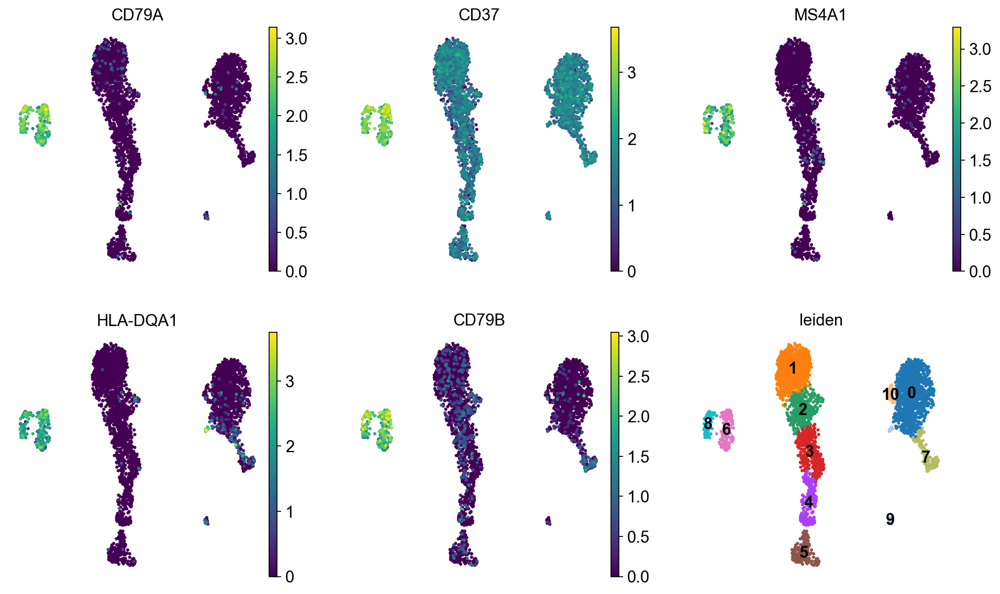

In [43]:
dc_cluster_genes = sc.get.rank_genes_groups_df(rna, group="8").head(5)["names"]
sc.pl.umap(
    rna,
    color=[*dc_cluster_genes, "leiden"],
    legend_loc="on data",
    frameon=False,
    ncols=3,
)

/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_stacked_violin.py:461: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  row_ax = sns.violinplot(
/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_stacked_violin.py:461: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  row_ax = sns.violinplot(
/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_stacked_violin.py:461: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  row_ax = sns.violinplot(
/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_stacked_violin.py:461: UserWarning: Numpy array is not a supported type for `palette`. P

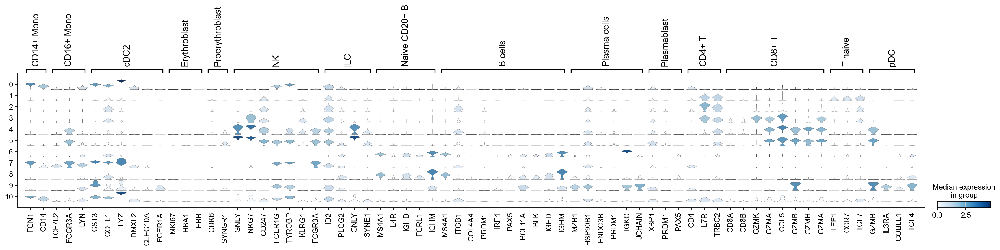

In [44]:
sc.pl.stacked_violin(rna, marker_genes, groupby="leiden");

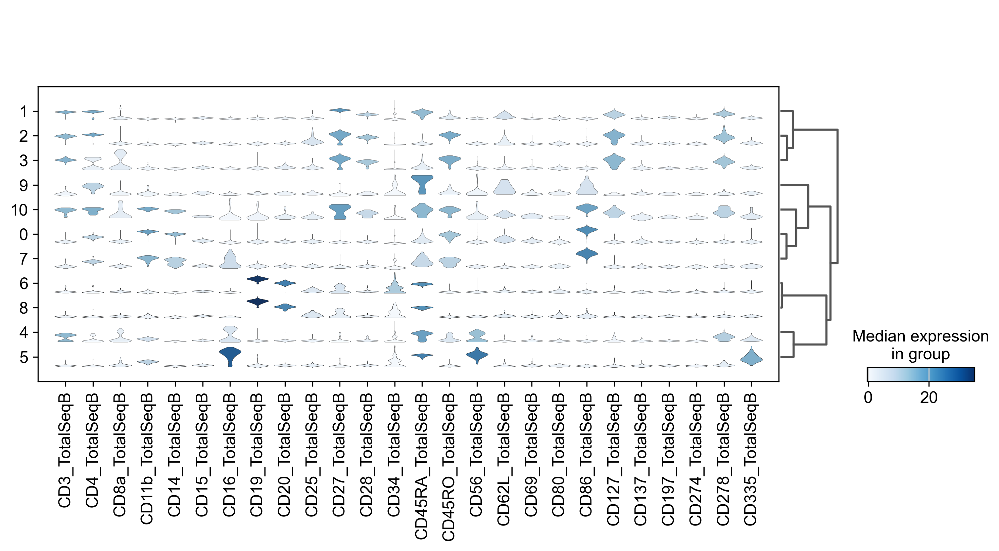

In [79]:
sc.pl.stacked_violin(prot, Surface_Markers, groupby="leiden", dendrogram=True);

In [45]:
rna.obs['celltype'] = rna.obs.leiden.astype("str").values
#rna.obs.celltype = rna.obs.celltype.replace(new_cluster_names)
rna.obs.celltype = rna.obs.celltype.astype("category")

In [46]:
import matplotlib
import matplotlib.pyplot as plt

cmap = plt.get_cmap('rainbow')
colors = cmap(np.linspace(0, 1, len(rna.obs.celltype.cat.categories)))

rna.uns["celltype_colors"] = list(map(matplotlib.colors.to_hex, colors))

/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


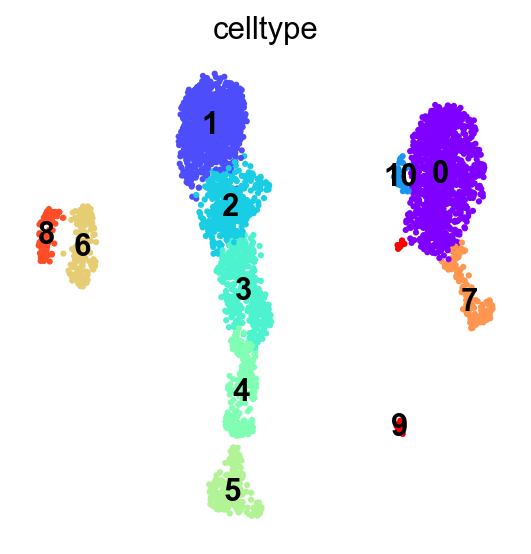

In [47]:
sc.pl.umap(rna, color="celltype", legend_loc="on data", frameon=False)

In [48]:
marker_genes_alt = ['IL7R', 'TRAC',
                'ITGB1', # CD29
                'FOXP3', 'IL2RA',
                'CD8A', 'CD8B', 'CCL5',
                'GNLY', 'NKG7', 'KLRC2',
                'CD79A', 'MS4A1', 'TCL1A', 'IGHM', 'IGHD',
                'IL4R', 'TCL1A',
                'KLF4', 'LYZ', 'S100A8', 'ITGAM', # CD11b
                'CD14', 'FCGR3A', 'MS4A7',
                'CST3', 'IRF8', 'TCF4']

/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


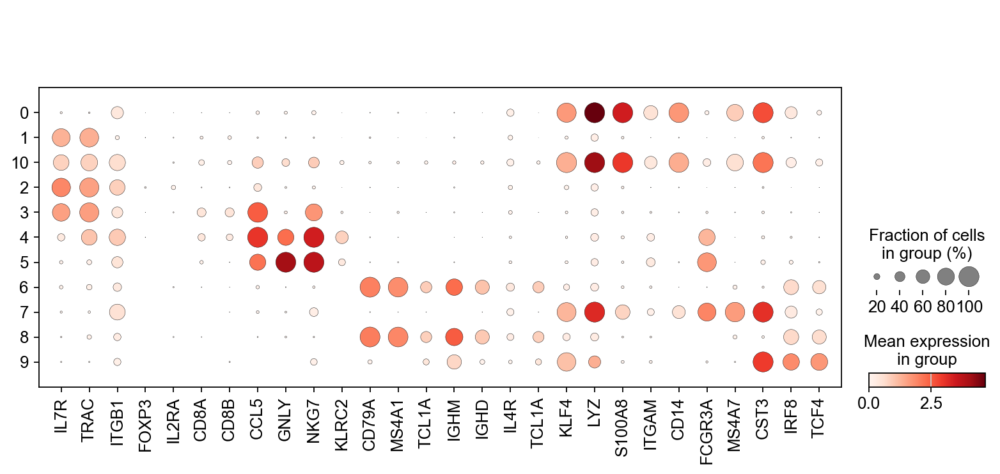

In [49]:
sc.pl.dotplot(rna, marker_genes_alt, groupby='celltype');

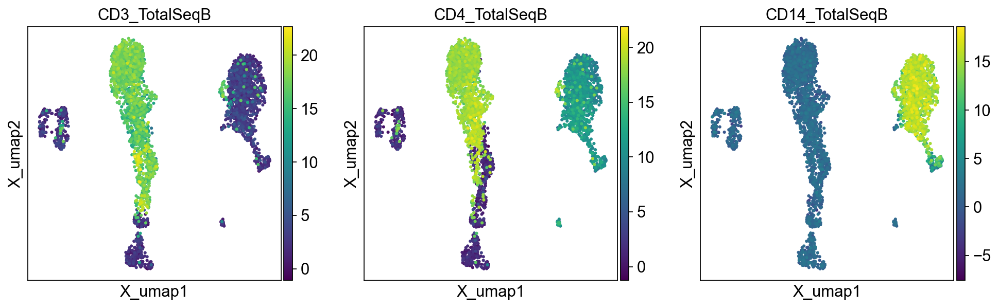

In [50]:
mu.pl.embedding(mdata, basis="rna:X_umap", color=["CD3_TotalSeqB", "CD4_TotalSeqB", "CD14_TotalSeqB"])

In [51]:
mu.pp.intersect_obs(mdata)

In [52]:
mu.tl.leiden(mdata, resolution=[2, .1], random_state=1)

/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


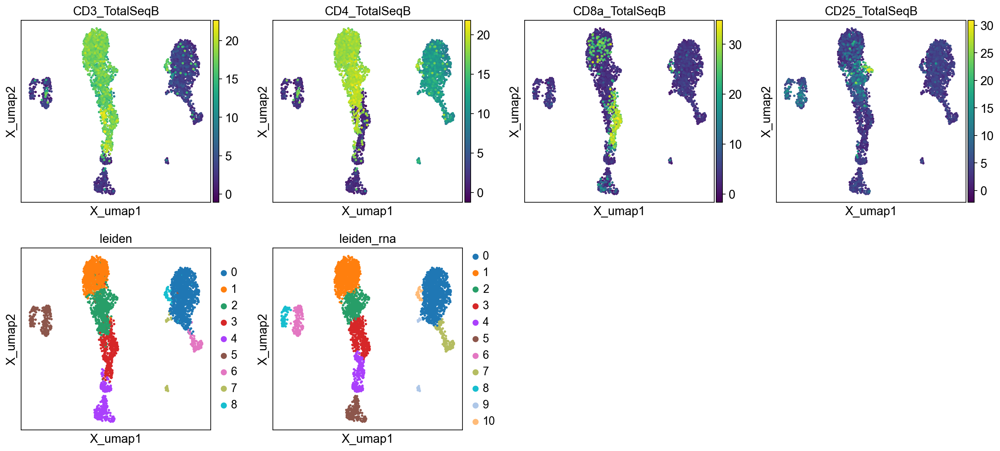

In [53]:
mdata.obs['leiden_rna'] = rna.obs['leiden']
mu.pl.embedding(mdata, basis="rna:X_umap", color=["CD3_TotalSeqB", "CD4_TotalSeqB", "CD8a_TotalSeqB", "CD25_TotalSeqB", "leiden", 'leiden_rna'])

/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


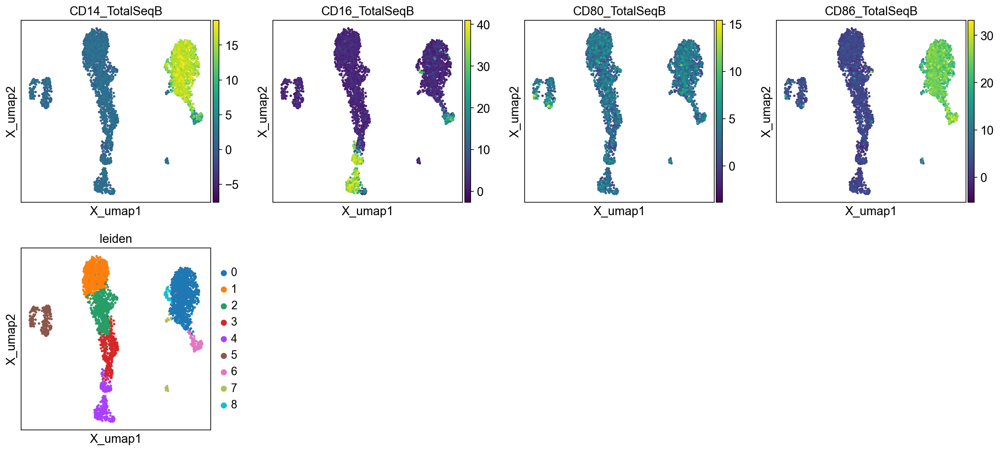

In [54]:
mu.pl.embedding(mdata, basis="rna:X_umap", color=["CD14_TotalSeqB", "CD16_TotalSeqB", "CD80_TotalSeqB", "CD86_TotalSeqB", "leiden"])

In [55]:
prot.var["highly_variable"] = True
mdata.update()

In [56]:

mu.tl.mofa(mdata, outfile="models/pbmc5k_citeseq.hdf5",
           n_factors=30)


        #########################################################
        ###           __  __  ____  ______                    ### 
        ###          |  \/  |/ __ \|  ____/\    _             ### 
        ###          | \  / | |  | | |__ /  \ _| |_           ### 
        ###          | |\/| | |  | |  __/ /\ \_   _|          ###
        ###          | |  | | |__| | | / ____ \|_|            ###
        ###          |_|  |_|\____/|_|/_/    \_\              ###
        ###                                                   ### 
        ######################################################### 
       
 
        
[2024-07-23 14:38:17] Setting data from MuData object...
Loaded view='rna' group='group1' with N=3891 samples and D=2000 features...
Loaded view='prot' group='group1' with N=3891 samples and D=32 features...


[2024-07-23 14:38:17] Setting model options...
Model options:
- Automatic Relevance Determination prior on the factors: True
- Automatic Relevance Determination prior on t

In [57]:
Surface_Markers = ['CD3_TotalSeqB', 'CD4_TotalSeqB', 'CD8a_TotalSeqB', 'CD11b_TotalSeqB',
       'CD14_TotalSeqB', 'CD15_TotalSeqB', 'CD16_TotalSeqB', 'CD19_TotalSeqB',
       'CD20_TotalSeqB', 'CD25_TotalSeqB', 'CD27_TotalSeqB', 'CD28_TotalSeqB',
       'CD34_TotalSeqB', 'CD45RA_TotalSeqB', 'CD45RO_TotalSeqB',
       'CD56_TotalSeqB', 'CD62L_TotalSeqB', 'CD69_TotalSeqB', 'CD80_TotalSeqB',
       'CD86_TotalSeqB', 'CD127_TotalSeqB', 'CD137_TotalSeqB',
       'CD197_TotalSeqB', 'CD274_TotalSeqB', 'CD278_TotalSeqB',
       'CD335_TotalSeqB']


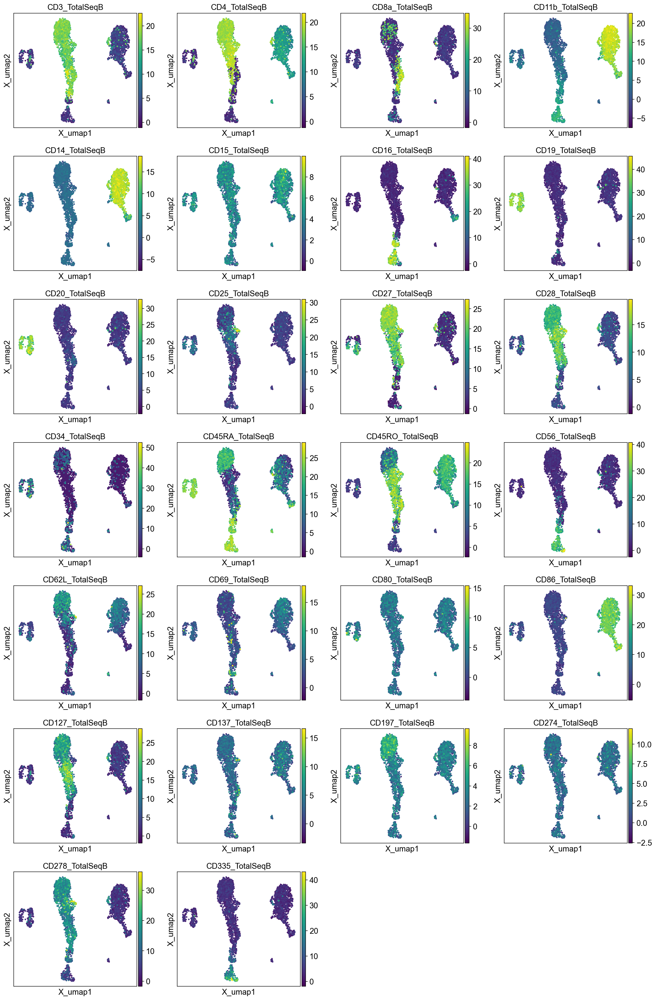

In [58]:
mu.pl.embedding(mdata, basis="rna:X_umap", color=Surface_Markers)

In [59]:
mdata.obs['celltype'] = rna.obs['celltype']

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


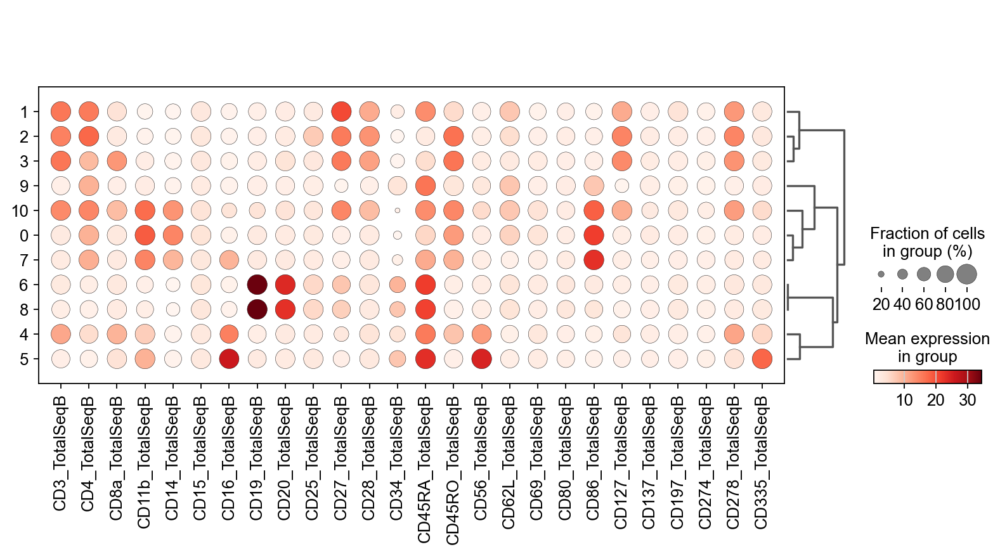

In [60]:
prot.obs['leiden'] = rna.obs['leiden']
sc.pl.dotplot(prot, Surface_Markers, groupby='leiden', dendrogram=True)

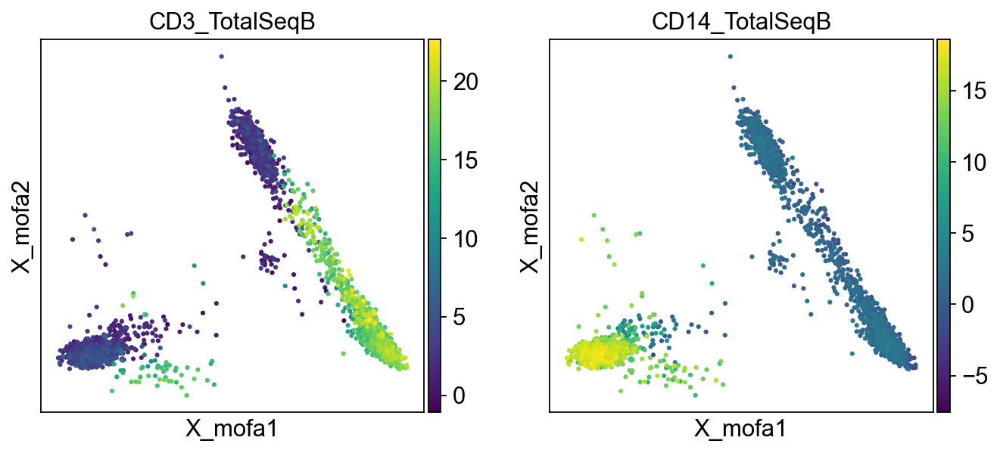

In [61]:
mu.pl.mofa(mdata, color=['CD3_TotalSeqB', 'CD14_TotalSeqB'])

In [62]:
sc.pp.neighbors(mdata, use_rep="X_mofa")
sc.tl.umap(mdata, random_state=1)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


In [63]:
mdata.uns["rna:celltype_colors"] = list(map(matplotlib.colors.to_hex, colors))

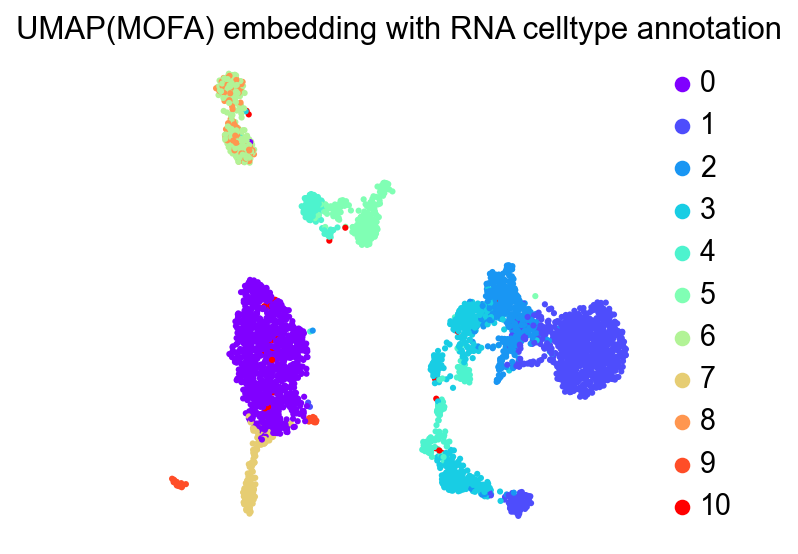

In [64]:
mu.pl.umap(mdata, color=['rna:celltype'], frameon=False,
           title="UMAP(MOFA) embedding with RNA celltype annotation")

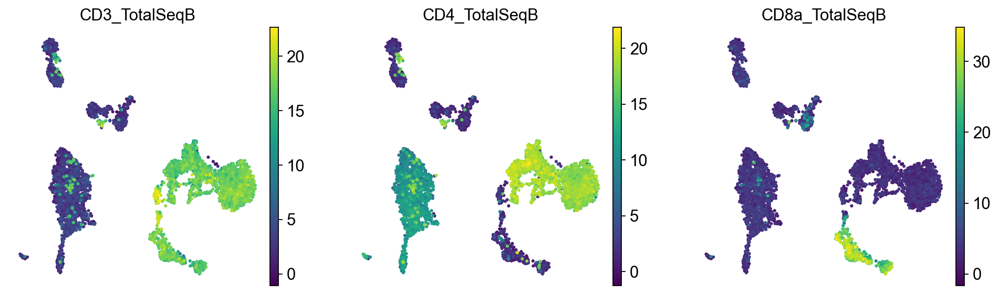

In [65]:
mu.pl.umap(mdata, color=['CD3_TotalSeqB', 'CD4_TotalSeqB', 'CD8a_TotalSeqB'], frameon=False, cmap='viridis')

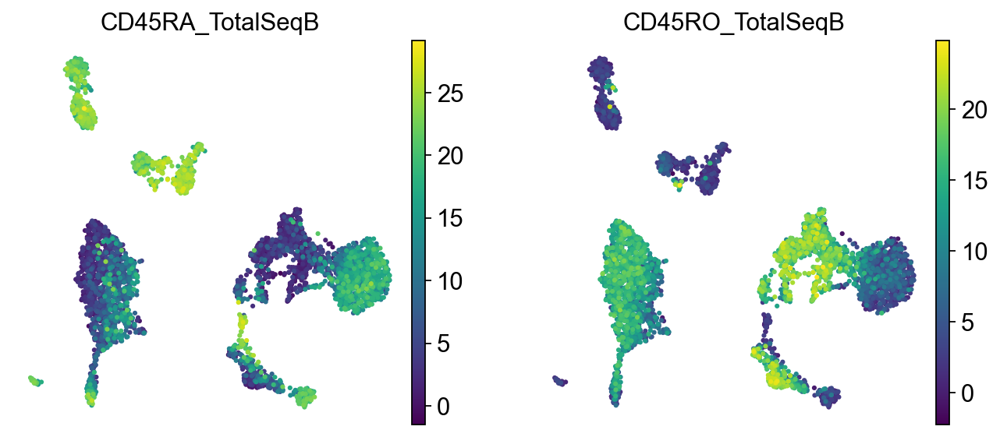

In [66]:
mu.pl.umap(mdata, color=['CD45RA_TotalSeqB', 'CD45RO_TotalSeqB'], frameon=False, cmap='viridis')

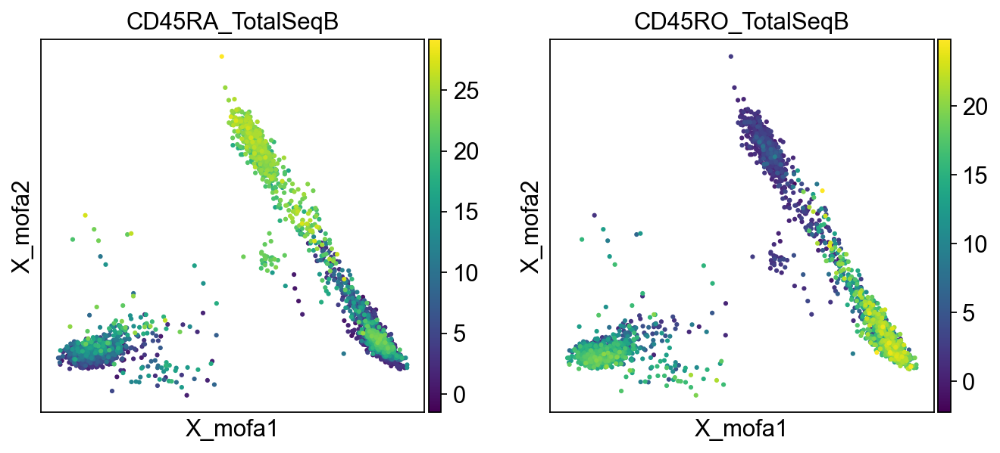

In [67]:
mu.pl.mofa(mdata, color=['CD45RA_TotalSeqB', 'CD45RO_TotalSeqB'])

In [68]:
from matplotlib import rcParams
rcParams['figure.dpi'] = 150

In [69]:
import mofax as mofa
model = mofa.mofa_model("models/pbmc5k_citeseq.hdf5")

<Axes: title={'center': 'rna'}, xlabel='Feature weight'>

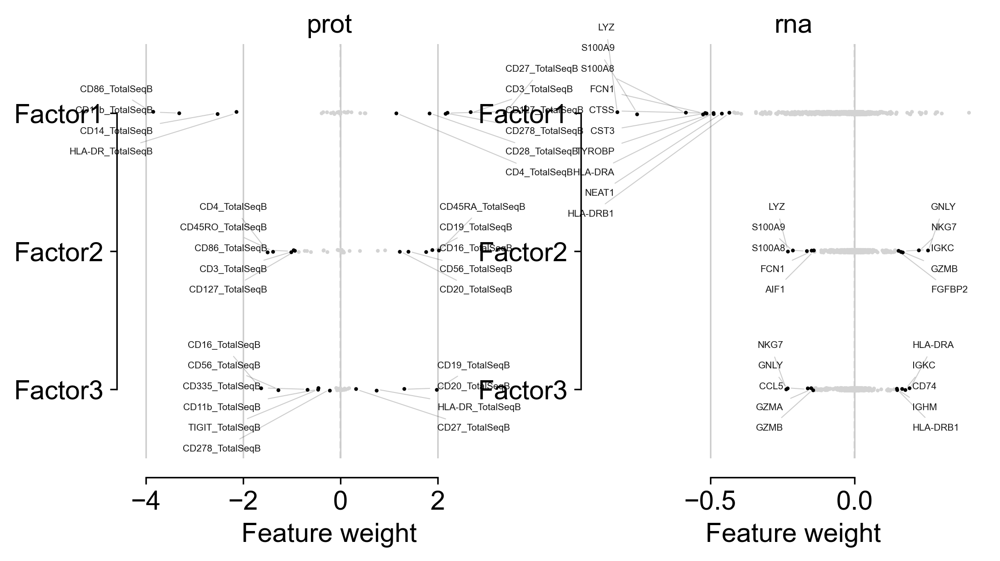

In [70]:
mofa.plot_weights(model, factors=range(3), n_features=10, sharex=False)

In [71]:
model.metadata["rna:celltype"] = model.metadata["rna:celltype"].astype('category')

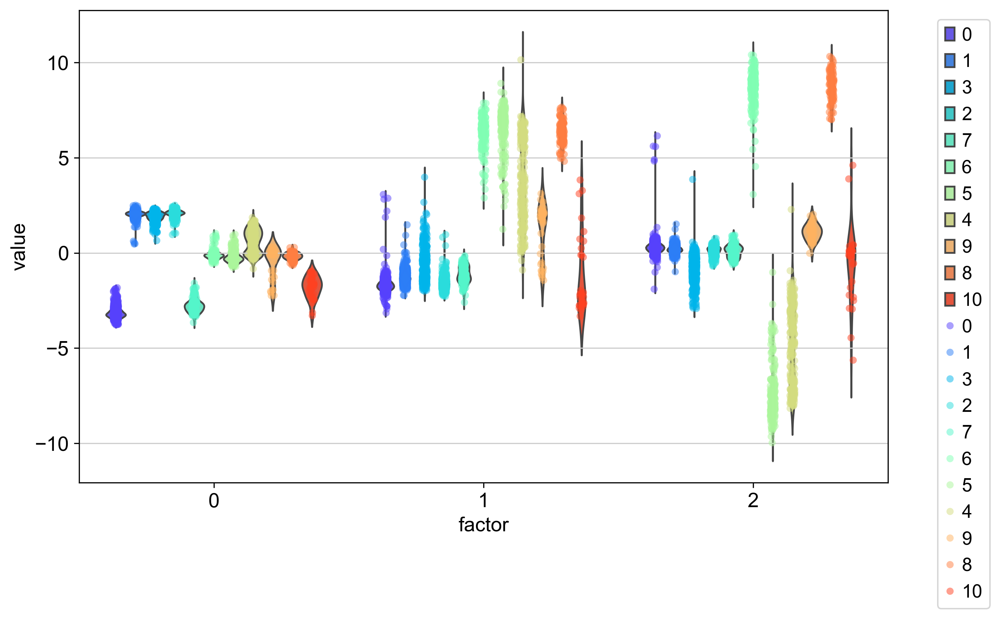

In [72]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Extract the factors and the cell type information
factors = model.get_factors()[:, :3]
celltype = mdata.obs['rna:celltype']

# Create a DataFrame for plotting
plot_data = pd.DataFrame(factors)
plot_data['celltype'] = celltype.values

# Melt the DataFrame to long format for seaborn
plot_data_melted = plot_data.melt(id_vars='celltype', var_name='factor', value_name='value')

# Plot the factors with seaborn
plt.figure(figsize=(10, 6))
sns.violinplot(data=plot_data_melted, x='factor', y='value', hue='celltype', palette='rainbow', inner=None)
sns.stripplot(data=plot_data_melted, x='factor', y='value', hue='celltype', dodge=True, palette='rainbow', alpha=0.5)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.show()


In [73]:
with mu.set_options(display_style="html", display_html_expand=0b000):
    display(mdata)

rna:n_genes_by_counts,int64,"2363,1259,1578,1908,1589,3136,1444,2699,2784,1495,..."
rna:log1p_n_genes_by_counts,float64,"7.77,7.14,7.36,7.55,7.37,8.05,7.28,7.90,7.93,7.31,..."
rna:total_counts,float32,"7375.00,3772.00,4902.00,6704.00,3900.00,11781.00,3..."
rna:log1p_total_counts,float32,"8.91,8.24,8.50,8.81,8.27,9.37,8.26,9.18,9.16,8.60,..."
rna:pct_counts_in_top_50_genes,float64,"32.89,42.79,46.02,41.51,37.74,35.11,41.23,36.36,29..."
rna:pct_counts_in_top_100_genes,float64,"44.35,56.50,58.49,57.01,46.36,45.12,53.48,46.43,41..."
rna:pct_counts_in_top_200_genes,float64,"55.97,67.66,66.83,66.44,56.33,55.93,63.07,57.53,54..."
rna:pct_counts_in_top_500_genes,float64,"69.94,79.88,78.01,77.40,72.08,69.08,75.55,70.51,68..."
rna:total_counts_mt,float32,"467.00,343.00,646.00,426.00,363.00,939.00,430.00,1..."
rna:log1p_total_counts_mt,float32,"6.15,5.84,6.47,6.06,5.90,6.85,6.07,7.10,6.21,6.02,..."
rna:pct_counts_mt,float32,"6.33,9.09,13.18,6.35,9.31,7.97,11.14,12.49,5.19,7...."


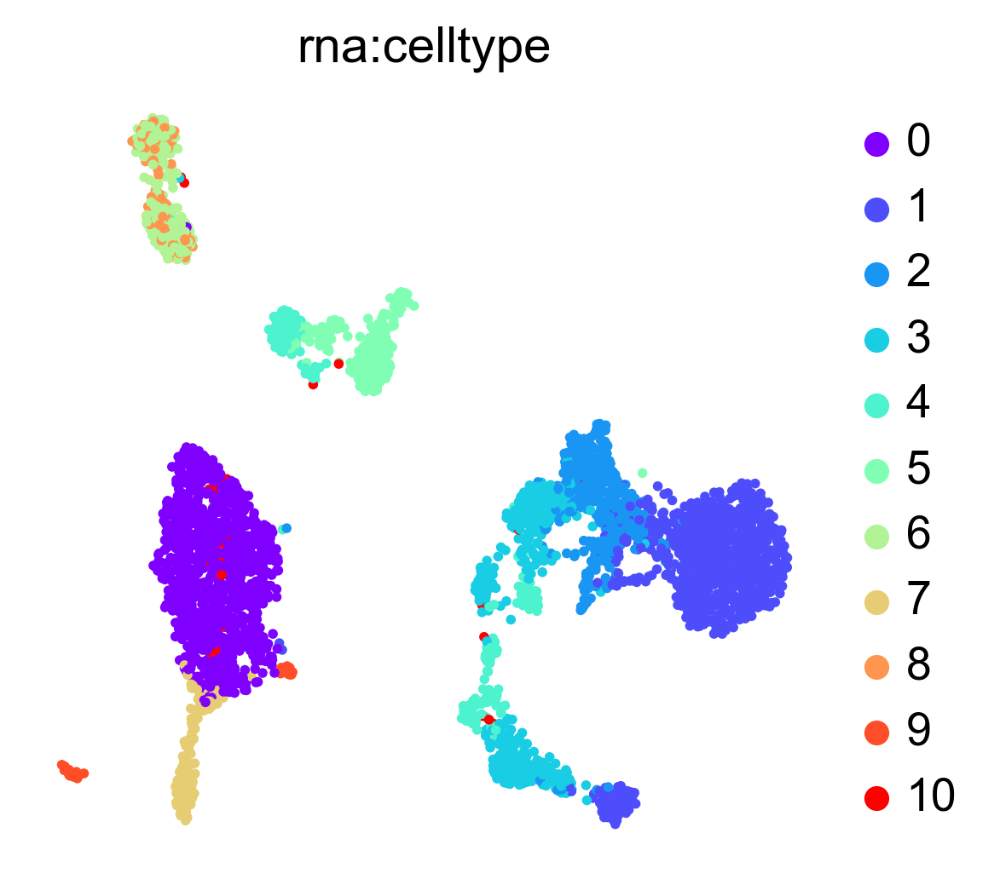

In [75]:
mu.pl.umap(mdata, color=['rna:celltype'], frameon=False, cmap='viridis')

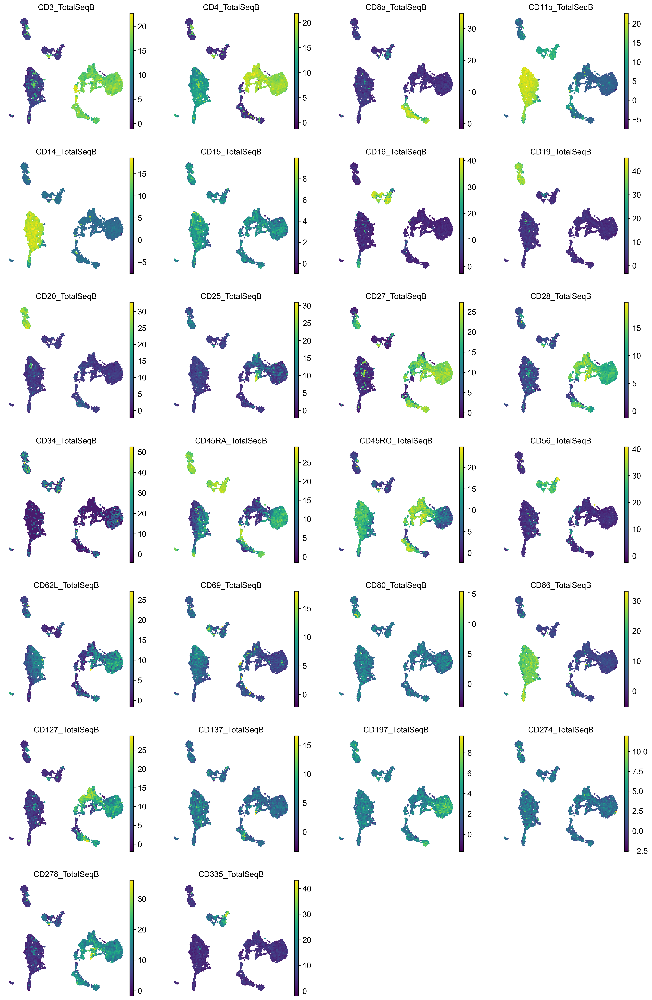

In [76]:
mu.pl.umap(mdata, color=Surface_Markers, frameon=False, cmap='viridis')